In [1]:
!python --version

Python 3.7.12


In [ ]:
# install Tensorflow version 2.11.0 (latest)
# !pip install --upgrade -q pip
# !pip install --upgrade -q tensorflow==2.11.0

In [2]:
import tensorflow as tf
print(tf.__version__)

2.11.0


In [3]:
# Clone the tensorflow models repository if it doesn't already exist
import os
import pathlib

if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 4401, done.
remote: Counting objects: 100% (4401/4401), done.
remote: Compressing objects: 100% (3215/3215), done.
remote: Total 4401 (delta 1188), reused 3100 (delta 1110), pack-reused 0 (from 0)
Receiving objects: 100% (4401/4401), 70.05 MiB | 43.85 MiB/s, done.
Resolving deltas: 100% (1188/1188), done.


In [4]:
cd /kaggle/working/

/kaggle/working


In [5]:
%%bash
cd /kaggle/working/models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install -q .

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask-cudf 21.12.2 requires cupy-cuda115, which is not installed.
cudf 21.12.2 requires cupy-cuda115, which is not installed.
tfx-bsl 1.12.0 requires google-api-python-client<2,>=1.7.11, but you have google-api-python-client 2.79.0 which is incompatible.
tfx-bsl 1.12.0 requires pyarrow<7,>=6, but you have pyarrow 5.0.0 which is incompatible.
tensorflow-transform 1.12.0 requires pyarrow<7,>=6, but you have pyarrow 5.0.0 which is incompatible.
pathos 0.3.0 requires dill>=0.3.6, but you have dill 0.3.1.1 which is incompatible.
onnx 1.13.1 requires protobuf<4,>=3.20.2, but you have protobuf 3.19.6 which is incompatible.
multiprocess 0.70.14 requires dill>=0.3.6, but you have dill 0.3.1.1 which is incompatible.
distributed 2021.11.2 requires dask==2021.11.2, but you have dask 2022.2.0 which is incompatible.
dask-cudf 21

In [6]:
!pip uninstall -y protobuf
!pip install protobuf==3.20.*
# and restart or try 2 times

Found existing installation: protobuf 3.19.6
Uninstalling protobuf-3.19.6:
  Successfully uninstalled protobuf-3.19.6
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 14.3 MB/s eta 0:00:0000:010:01
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf 21.12.2 requires cupy-cuda115, which is not installed.
tfx-bsl 1.12.0 requires google-api-python-client<2,>=1.7.11, but you have google-api-python-client 2.79.0 which is incompatible.
tfx-bsl 1.12.0 requires pyarrow<7,>=6, but you have pyarrow 5.0.0 which is incompatible.
tensorflow 2.11.0 requires protobuf<3.20,>=3.9.2, but you have protobuf 3.20.3 which is incompatible.
tensorflow-transform 1.12.0 requires pyarrow<7,>=6, but you have pyarrow 5.0.0 which is incompatible.
tensorflow-serving-api 2.11.0 requires protobuf<3.20,>=3.9.2, but you have protobuf 3.20.3 which is incompatible.
tensorboardx 2.5.1 requ

In [7]:
#run model builder test
!python /kaggle/working/models/research/object_detection/builders/model_builder_tf2_test.py

Running tests under Python 3.7.12: /opt/conda/bin/python
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_deepmac
/opt/conda/lib/python3.7/site-packages/object_detection/builders/model_builder.py:1112: DeprecationWarning: The 'warn' function is deprecated, use 'warning' instead
  logging.warn(('Building experimental DeepMAC meta-arch.'
W0119 05:43:33.620851 134466429392704 model_builder.py:1112] Building experimental DeepMAC meta-arch. Some features may be omitted.
I0119 05:43:33.927396 134466429392704 test_util.py:2458] time(__main__.ModelBuilderTF2Test.test_create_center_net_deepmac): 4.53s
[       OK ] ModelBuilderTF2Test.test_create_center_net_deepmac
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_model0 (customize_head_params=True)
I0119 05:43:34.765574 134466429392704 test_util.py:2458] time(__main__.ModelBuilderTF2Test.test_create_center_net_model0 (customize_head_params=True)): 0.84s
[       OK ] ModelBuilderTF2Test.test_create_center_net_model0 (customize_head_

In [8]:
import json
from collections import defaultdict
from pprint import pprint

def check_coco_json(ann_file_path):
    with open(ann_file_path, 'r') as f:
        coco_data = json.load(f)

    # Check top-level keys
    assert 'images' in coco_data, "'images' key not found in JSON"
    assert 'annotations' in coco_data, "'annotations' key not found in JSON"
    assert 'categories' in coco_data, "'categories' key not found in JSON"

    print(f"Total images: {len(coco_data['images'])}")
    print(f"Total annotations: {len(coco_data['annotations'])}")
    print(f"Total categories: {len(coco_data['categories'])}")

    print("\nSample category definitions:")
    pprint(coco_data['categories'])

    # Check required annotation keys (excluding segmentation)
    required_ann_keys = {"id", "image_id", "bbox", "category_id"}
    missing_fields = []

    for i, ann in enumerate(coco_data['annotations']):
        if not required_ann_keys.issubset(ann):
            missing_fields.append(i)

    if missing_fields:
        print(f"⚠️ Missing required fields in {len(missing_fields)} annotations. Examples: {missing_fields[:5]}")
    else:
        print("✅ All annotations have required fields: 'id', 'image_id', 'bbox', 'category_id'")

    # Optional: Check iscrowd and area fields
    optional_fields = ["iscrowd", "area"]
    count_missing = defaultdict(int)

    for ann in coco_data['annotations']:
        for field in optional_fields:
            if field not in ann:
                count_missing[field] += 1

    for field in optional_fields:
        if count_missing[field]:
            print(f"⚠️ Missing '{field}' in {count_missing[field]} annotations")
        else:
            print(f"✅ All annotations have '{field}'")

# Example usage:
check_coco_json("/kaggle/input/aquarium-json/train/_annotations.coco.json")
check_coco_json("/kaggle/input/aquarium-json/valid/_annotations.coco.json")

Total images: 448
Total annotations: 3324
Total categories: 8

Sample category definitions:
[{'id': 0, 'name': 'creatures', 'supercategory': 'none'},
 {'id': 1, 'name': 'fish', 'supercategory': 'creatures'},
 {'id': 2, 'name': 'jellyfish', 'supercategory': 'creatures'},
 {'id': 3, 'name': 'penguin', 'supercategory': 'creatures'},
 {'id': 4, 'name': 'puffin', 'supercategory': 'creatures'},
 {'id': 5, 'name': 'shark', 'supercategory': 'creatures'},
 {'id': 6, 'name': 'starfish', 'supercategory': 'creatures'},
 {'id': 7, 'name': 'stingray', 'supercategory': 'creatures'}]
✅ All annotations have required fields: 'id', 'image_id', 'bbox', 'category_id'
✅ All annotations have 'iscrowd'
✅ All annotations have 'area'
Total images: 127
Total annotations: 909
Total categories: 8

Sample category definitions:
[{'id': 0, 'name': 'creatures', 'supercategory': 'none'},
 {'id': 1, 'name': 'fish', 'supercategory': 'creatures'},
 {'id': 2, 'name': 'jellyfish', 'supercategory': 'creatures'},
 {'id': 3, '

In [11]:
import json
import csv
import os

def coco_to_csv(coco_json, image_dir, output_csv):
    with open(coco_json, "r") as f:
        coco = json.load(f)

    # maps
    images = {img["id"]: img for img in coco["images"]}
    categories = {cat["id"]: cat["name"] for cat in coco["categories"]}

    rows = []

    for ann in coco["annotations"]:
        if ann.get("iscrowd", 0) == 1:
            continue

        img = images[ann["image_id"]]
        filename = img["file_name"]
        width = img["width"]
        height = img["height"]

        x, y, w, h = ann["bbox"]
        if w <= 0 or h <= 0:
            continue

        xmin = x
        ymin = y
        xmax = x + w
        ymax = y + h

        if xmax <= xmin or ymax <= ymin:
            continue

        rows.append([
            filename,
            width,
            height,
            categories[ann["category_id"]],
            xmin,
            ymin,
            xmax,
            ymax
        ])

    with open(output_csv, "w", newline="") as f:
        writer = csv.writer(f)
        writer.writerow(["filename","width","height","class","xmin","ymin","xmax","ymax"])
        writer.writerows(rows)

    print(f"CSV written: {output_csv} ({len(rows)} boxes)")

In [12]:
train_images_dir="/kaggle/input/aquarium-json/train"
train_annotation_file="/kaggle/input/aquarium-json/train/_annotations.coco.json"

valid_images_dir="/kaggle/input/aquarium-json/valid"
valid_annotation_file="/kaggle/input/aquarium-json/valid/_annotations.coco.json"

In [13]:
!mkdir /kaggle/working/Aquarium_det_tfrecords

In [14]:
coco_to_csv(train_annotation_file, train_images_dir, "/kaggle/working/Aquarium_det_tfrecords/train.csv")
coco_to_csv(valid_annotation_file, valid_images_dir, "/kaggle/working/Aquarium_det_tfrecords/valid.csv")

CSV written: /kaggle/working/Aquarium_det_tfrecords/train.csv (3324 boxes)
CSV written: /kaggle/working/Aquarium_det_tfrecords/valid.csv (909 boxes)


In [15]:
%%writefile /kaggle/working/Aquarium_det_tfrecords/label_map.pbtxt
item {
    id: 1
    name: "fish"
}
item {
    id: 2
    name: "jellyfish"
}
item {
    id: 3
    name: "penguin"
}
item {
    id: 4
    name: "puffin"
}
item {
    id: 5
    name: "shark"
}
item {
    id: 6
    name: "starfish"
}
item {
    id: 7
    name: "stingray"
}

Writing /kaggle/working/Aquarium_det_tfrecords/label_map.pbtxt


In [16]:
'''
Reference repo: https://github.com/EdjeElectronics/TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10/blob/master/generate_tfrecord.py
'''

import tensorflow as tf
import pandas as pd
import argparse
import logging
import io
import os

from PIL import Image
from object_detection.utils import dataset_util
from collections import namedtuple, OrderedDict

logging.basicConfig(format='%(levelname)s:%(message)s', level=logging.INFO)

class TFRecord:
    def __init__(self, labelmap_file) -> None:
        f = open("/kaggle/working/Aquarium_det_tfrecords/label_map.pbtxt", "r")
        labelmap = f.read()
        self.class_names = self.init_names(labelmap)
        print(self.class_names)

    def init_names(self, labelmap):
        items = labelmap.split('item')[1:]
        items_dict = {}
    
        for item in items:
            if 'name' not in item or 'id' not in item:
                continue
    
            name = item.split('name')[1].split('"')[1]
            name_id = int(item.split('id')[1].split(':')[1].split('\n')[0])
    
            items_dict[name] = name_id
    
        return items_dict

    def class_text_to_int(self, row_label) -> int:
        if self.class_names[row_label] is not None:
            return self.class_names[row_label]
        else:
            None

    def split(self, df, group):
        data = namedtuple('data', ['filename', 'object'])
        gb = df.groupby(group)
        return [data(filename, gb.get_group(x)) for filename, x in \
                                            zip(gb.groups.keys(), gb.groups)]


    def create_tf(self, group, path):
        with tf.io.gfile.GFile(os.path.join(path, '{}'\
                                        .format(group.filename)), 'rb') as fid:
            encoded_jpg = fid.read()
        encoded_jpg_io = io.BytesIO(encoded_jpg)
        image = Image.open(encoded_jpg_io)
        width, height = image.size

        filename = group.filename.encode('utf8')
        image_format = b'jpg'
        xmins = []
        xmaxs = []
        ymins = []
        ymaxs = []
        classes_text = []
        classes = []

        for index, row in group.object.iterrows():
            xmins.append(row['xmin'] / width)
            xmaxs.append(row['xmax'] / width)
            ymins.append(row['ymin'] / height)
            ymaxs.append(row['ymax'] / height)
            classes_text.append(row['class'].encode('utf8'))
            classes.append(self.class_text_to_int(row['class']))

        tf_sample = tf.train.Example(features=tf.train.Features(feature={
            'image/height': dataset_util.int64_feature(height),
            'image/width': dataset_util.int64_feature(width),
            'image/filename': dataset_util.bytes_feature(filename),
            'image/source_id': dataset_util.bytes_feature(filename),
            'image/encoded': dataset_util.bytes_feature(encoded_jpg),
            'image/format': dataset_util.bytes_feature(image_format),
            'image/object/bbox/xmin': dataset_util.float_list_feature(xmins),
            'image/object/bbox/xmax': dataset_util.float_list_feature(xmaxs),
            'image/object/bbox/ymin': dataset_util.float_list_feature(ymins),
            'image/object/bbox/ymax': dataset_util.float_list_feature(ymaxs),
            'image/object/class/text':\
                                dataset_util.bytes_list_feature(classes_text),
            'image/object/class/label':\
                                    dataset_util.int64_list_feature(classes),
        }))
        return tf_sample

    def generate(self, output_path, image_dir, csv_input) -> None:
        writer = tf.io.TFRecordWriter(output_path)
        path = os.path.join(image_dir)
        data = pd.read_csv(csv_input)
        grouped = self.split(data, 'filename')

        for group in grouped:
            try:
              tf_sample = self.create_tf(group, path)
              writer.write(tf_sample.SerializeToString())
            except:
              continue
        logging.info('Successfully created the TFRecords: {}'.format(output_path))

In [32]:
tf_record = TFRecord("/kaggle/working/Aquarium_det_tfrecords/label_map.pbtxt")
tf_record.generate("/kaggle/working/Aquarium_det_tfrecords/train.record", "/kaggle/input/aquarium-csv/train", "/kaggle/input/aquarium-csv/train/_annotations.csv")
tf_record.generate("/kaggle/working/Aquarium_det_tfrecords/valid.record", "/kaggle/input/aquarium-csv/valid", "/kaggle/input/aquarium-csv/valid/_annotations.csv")

{'fish': 1, 'jellyfish': 2, 'penguin': 3, 'puffin': 4, 'shark': 5, 'starfish': 6, 'stingray': 7}


In [17]:
tf_record = TFRecord("/kaggle/working/Aquarium_det_tfrecords/label_map.pbtxt")
tf_record.generate("/kaggle/working/Aquarium_det_tfrecords/train2.record", "/kaggle/input/aquarium-json/train", "/kaggle/working/Aquarium_det_tfrecords/train.csv")
tf_record.generate("/kaggle/working/Aquarium_det_tfrecords/valid2.record", "/kaggle/input/aquarium-json/valid", "/kaggle/working/Aquarium_det_tfrecords/valid.csv")

{'fish': 1, 'jellyfish': 2, 'penguin': 3, 'puffin': 4, 'shark': 5, 'starfish': 6, 'stingray': 7}


In [18]:
# train_record_path = '/kaggle/input/aquarium-tfrecord/train/creatures.tfrecord'
# valid_record_path = '/kaggle/input/aquarium-tfrecord/valid/creatures.tfrecord'
# labelmap_path = '/kaggle/input/aquarium-tfrecord/train/creatures_label_map.pbtxt'

# train_record_path = '/kaggle/working/Aquarium_det_tfrecords/train.record'
# valid_record_path = '/kaggle/working/Aquarium_det_tfrecords/valid.record'
# labelmap_path = '/kaggle/working/Aquarium_det_tfrecords/label_map.pbtxt'

train_record_path = '/kaggle/working/Aquarium_det_tfrecords/train2.record'
valid_record_path = '/kaggle/working/Aquarium_det_tfrecords/valid2.record'
labelmap_path = '/kaggle/working/Aquarium_det_tfrecords/label_map.pbtxt'

In [19]:
# batch_size = 8
# num_steps = 2800
# num_eval_steps = 16
num_classes = 7

batch_size = 4
num_steps = 5600
num_eval_steps = 32

In [20]:
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d1_coco17_tpu-32.tar.gz
!tar -xf efficientdet_d1_coco17_tpu-32.tar.gz

--2026-01-16 15:31:07--  http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d1_coco17_tpu-32.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 74.125.23.207, 108.177.97.207, 64.233.189.207, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|74.125.23.207|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 51839363 (49M) [application/x-tar]
Saving to: ‘efficientdet_d1_coco17_tpu-32.tar.gz’

efficientdet_d1_coc 100%[===================>]  49.44M  15.8MB/s    in 3.1s    

2026-01-16 15:31:10 (15.8 MB/s) - ‘efficientdet_d1_coco17_tpu-32.tar.gz’ saved [51839363/51839363]



In [36]:
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d2_coco17_tpu-32.tar.gz
!tar -xf efficientdet_d2_coco17_tpu-32.tar.gz

--2026-01-16 18:06:50--  http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d2_coco17_tpu-32.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 209.85.200.207, 64.233.181.207, 74.125.201.207, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|209.85.200.207|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 62929273 (60M) [application/x-tar]
Saving to: ‘efficientdet_d2_coco17_tpu-32.tar.gz’

efficientdet_d2_coc 100%[===================>]  60.01M   131MB/s    in 0.5s    

2026-01-16 18:06:51 (131 MB/s) - ‘efficientdet_d2_coco17_tpu-32.tar.gz’ saved [62929273/62929273]



In [20]:
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d3_coco17_tpu-32.tar.gz
!tar -xf efficientdet_d3_coco17_tpu-32.tar.gz

--2026-01-19 05:46:44--  http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d3_coco17_tpu-32.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 173.194.193.207, 74.125.69.207, 108.177.121.207, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|173.194.193.207|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 92858658 (89M) [application/x-tar]
Saving to: ‘efficientdet_d3_coco17_tpu-32.tar.gz’

efficientdet_d3_coc 100%[===================>]  88.56M   102MB/s    in 0.9s    

2026-01-19 05:46:45 (102 MB/s) - ‘efficientdet_d3_coco17_tpu-32.tar.gz’ saved [92858658/92858658]



In [22]:
fine_tune_checkpoint = '/kaggle/working/efficientdet_d3_coco17_tpu-32/checkpoint/ckpt-0'

In [22]:
!wget https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_efficientdet_d1_640x640_coco17_tpu-8.config

--2026-01-16 15:31:27--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_efficientdet_d1_640x640_coco17_tpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.111.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4630 (4.5K) [text/plain]
Saving to: ‘ssd_efficientdet_d1_640x640_coco17_tpu-8.config’

ssd_efficientdet_d1 100%[===================>]   4.52K  --.-KB/s    in 0s      

2026-01-16 15:31:28 (43.7 MB/s) - ‘ssd_efficientdet_d1_640x640_coco17_tpu-8.config’ saved [4630/4630]



In [38]:
!wget https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_efficientdet_d2_768x768_coco17_tpu-8.config

--2026-01-16 18:07:14--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_efficientdet_d2_768x768_coco17_tpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.110.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4632 (4.5K) [text/plain]
Saving to: ‘ssd_efficientdet_d2_768x768_coco17_tpu-8.config’

ssd_efficientdet_d2 100%[===================>]   4.52K  --.-KB/s    in 0s      

2026-01-16 18:07:14 (41.8 MB/s) - ‘ssd_efficientdet_d2_768x768_coco17_tpu-8.config’ saved [4632/4632]



In [23]:
!wget https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_efficientdet_d3_896x896_coco17_tpu-32.config

--2026-01-19 05:46:58--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_efficientdet_d3_896x896_coco17_tpu-32.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.110.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4633 (4.5K) [text/plain]
Saving to: ‘ssd_efficientdet_d3_896x896_coco17_tpu-32.config’

ssd_efficientdet_d3 100%[===================>]   4.52K  --.-KB/s    in 0s      

2026-01-19 05:46:58 (56.9 MB/s) - ‘ssd_efficientdet_d3_896x896_coco17_tpu-32.config’ saved [4633/4633]



In [24]:
base_config_path = '/kaggle/working/ssd_efficientdet_d3_896x896_coco17_tpu-32.config'

In [26]:
# edit configuration file
import re

with open(base_config_path) as f:
    config = f.read()

with open('efficientdet_d3.config', 'w') as f:
  
  # Set labelmap path
  config = re.sub('label_map_path: ".*?"', 
             'label_map_path: "{}"'.format(labelmap_path), config)
  
  # Set fine_tune_checkpoint path
  config = re.sub('fine_tune_checkpoint: ".*?"',
                  'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), config)
  
  # Set train tf-record file path
  config = re.sub('(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 
                  'input_path: "{}"'.format(train_record_path), config)
  
  # Set test tf-record file path
  config = re.sub('(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 
                  'input_path: "{}"'.format(valid_record_path), config)
  
  # Set number of classes.
  config = re.sub('num_classes: [0-9]+',
                  'num_classes: {}'.format(num_classes), config)
  
  # Set batch size
  config = re.sub('batch_size: [0-9]+',
                  'batch_size: {}'.format(batch_size), config)
  
  # Set training steps
  config = re.sub('num_steps: [0-9]+',
                  'num_steps: {}'.format(num_steps), config)
  
  # Set fine-tune checkpoint type to detection
  config = re.sub('fine_tune_checkpoint_type: "classification"', 
             'fine_tune_checkpoint_type: "{}"'.format('detection'), config)
  
  f.write(config)

In [27]:
%cat /kaggle/working/efficientdet_d3.config

 # SSD with EfficientNet-b3 + BiFPN feature extractor,
# shared box predictor and focal loss (a.k.a EfficientDet-d3).
# See EfficientDet, Tan et al, https://arxiv.org/abs/1911.09070
# See Lin et al, https://arxiv.org/abs/1708.02002
# Trained on COCO, initialized from an EfficientNet-b3 checkpoint.
#
# Train on TPU-32

model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 7
    add_background_class: false
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      

In [28]:
def get_pipeline_config(path):
    pipeline_config = pipeline_pb2.TrainEvalPipelineConfig()
    with tf.io.gfile.GFile(path, 'r') as f:
        text_format.Merge(f.read(), pipeline_config)

    return pipeline_config

def save_pipeline_config(pipeline_config, path):
    config_text = text_format.MessageToString(pipeline_config)
    with tf.io.gfile.GFile(path, "wb") as f:
        f.write(config_text)

In [29]:
from object_detection.protos import pipeline_pb2
from google.protobuf import text_format

In [30]:
pipeline_config_path = '/kaggle/working/efficientdet_d3.config'
pipeline_config = get_pipeline_config(pipeline_config_path)

In [31]:
pipeline_config.eval_config.batch_size = 1

In [36]:
# pipeline_config.train_config.optimizer.momentum_optimizer.learning_rate.cosine_decay_learning_rate.total_steps = 2800
# pipeline_config.train_config.optimizer.momentum_optimizer.learning_rate.cosine_decay_learning_rate.warmup_steps = 560

pipeline_config.train_config.optimizer.momentum_optimizer.learning_rate.cosine_decay_learning_rate.total_steps = 5600
pipeline_config.train_config.optimizer.momentum_optimizer.learning_rate.cosine_decay_learning_rate.warmup_steps = 1120

In [79]:
pipeline_config.train_config.optimizer.momentum_optimizer.learning_rate.cosine_decay_learning_rate.total_steps = 8960
pipeline_config.train_config.optimizer.momentum_optimizer.learning_rate.cosine_decay_learning_rate.warmup_steps = 1120
pipeline_config.train_config.num_steps = 8960
pipeline_config.train_config.fine_tune_checkpoint = ""

In [32]:
pipeline_config.train_config.optimizer.momentum_optimizer.learning_rate.cosine_decay_learning_rate.total_steps = 13500
pipeline_config.train_config.optimizer.momentum_optimizer.learning_rate.cosine_decay_learning_rate.warmup_steps = 1120
pipeline_config.train_config.num_steps = 13500
pipeline_config.train_config.fine_tune_checkpoint = ""

In [ ]:
# pipeline_config.model.ssd.post_processing.batch_non_max_suppression.max_detections_per_class = 10
# pipeline_config.model.ssd.post_processing.batch_non_max_suppression.max_total_detections = 10

In [34]:
save_pipeline_config(pipeline_config, '/kaggle/working/efficientdet_d3.config')

In [35]:
%cat /kaggle/working/efficientdet_d3.config

model {
  ssd {
    num_classes: 7
    image_resizer {
      keep_aspect_ratio_resizer {
        min_dimension: 896
        max_dimension: 896
        pad_to_max_dimension: true
      }
    }
    feature_extractor {
      type: "ssd_efficientnet-b3_bifpn_keras"
      conv_hyperparams {
        regularizer {
          l2_regularizer {
            weight: 4e-05
          }
        }
        initializer {
          truncated_normal_initializer {
            mean: 0.0
            stddev: 0.03
          }
        }
        activation: SWISH
        batch_norm {
          decay: 0.99
          scale: true
          epsilon: 0.001
        }
        force_use_bias: true
      }
      bifpn {
        min_level: 3
        max_level: 7
        num_iterations: 6
        num_filters: 160
      }
    }
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        

In [36]:
!mkdir efficientdet_d3_training

In [37]:
!cp -r /kaggle/input/efficientdet-d3-training2/tensorflow2/default/1/kaggle/working/efficientdet_d3_training/efficientdet_d3_training /kaggle/working/efficientdet_d3_training

In [40]:
# model_dir = '/kaggle/working/efficientdet_d3_training/'
model_dir = '/kaggle/working/efficientdet_d3_training/efficientdet_d3_training'
pipeline_config_path = '/kaggle/working/efficientdet_d3.config'

In [56]:
!python /kaggle/working/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_config_path} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1 \
    --num_eval_steps={num_eval_steps}

I0116 15:34:09.360524 139750430803776 mirrored_strategy.py:374] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
I0116 15:34:09.364300 139750430803776 config_util.py:552] Maybe overwriting train_steps: 2800
I0116 15:34:09.364453 139750430803776 config_util.py:552] Maybe overwriting use_bfloat16: False
I0116 15:34:09.381537 139750430803776 ssd_efficientnet_bifpn_feature_extractor.py:162] EfficientDet EfficientNet backbone version: efficientnet-b1
I0116 15:34:09.381717 139750430803776 ssd_efficientnet_bifpn_feature_extractor.py:163] EfficientDet BiFPN num filters: 88
I0116 15:34:09.381832 139750430803776 ssd_efficientnet_bifpn_feature_extractor.py:165] EfficientDet BiFPN num iterations: 4
I0116 15:34:09.387810 139750430803776 efficientnet_model.py:143] round_filter input=32 output=32
I0116 15:34:09.435734 139750430803776 cross_device_ops.py:618] Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then 

In [61]:
# D2
!python /kaggle/working/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_config_path} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1 \
    --num_eval_steps={num_eval_steps}

I0116 18:10:51.419085 137336517920576 mirrored_strategy.py:374] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
I0116 18:10:51.423227 137336517920576 config_util.py:552] Maybe overwriting train_steps: 2800
I0116 18:10:51.423448 137336517920576 config_util.py:552] Maybe overwriting use_bfloat16: False
I0116 18:10:51.447023 137336517920576 ssd_efficientnet_bifpn_feature_extractor.py:162] EfficientDet EfficientNet backbone version: efficientnet-b2
I0116 18:10:51.447165 137336517920576 ssd_efficientnet_bifpn_feature_extractor.py:163] EfficientDet BiFPN num filters: 112
I0116 18:10:51.447232 137336517920576 ssd_efficientnet_bifpn_feature_extractor.py:165] EfficientDet BiFPN num iterations: 5
I0116 18:10:51.452129 137336517920576 efficientnet_model.py:143] round_filter input=32 output=32
I0116 18:10:51.493650 137336517920576 cross_device_ops.py:618] Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then

In [48]:
# D3
!python /kaggle/working/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_config_path} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1 \
    --num_eval_steps={num_eval_steps}

I0118 11:47:14.560886 136535040685888 mirrored_strategy.py:374] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
I0118 11:47:14.565095 136535040685888 config_util.py:552] Maybe overwriting train_steps: 5600
I0118 11:47:14.565265 136535040685888 config_util.py:552] Maybe overwriting use_bfloat16: False
I0118 11:47:14.586475 136535040685888 ssd_efficientnet_bifpn_feature_extractor.py:162] EfficientDet EfficientNet backbone version: efficientnet-b3
I0118 11:47:14.586638 136535040685888 ssd_efficientnet_bifpn_feature_extractor.py:163] EfficientDet BiFPN num filters: 160
I0118 11:47:14.586710 136535040685888 ssd_efficientnet_bifpn_feature_extractor.py:165] EfficientDet BiFPN num iterations: 6
I0118 11:47:14.591180 136535040685888 efficientnet_model.py:143] round_filter input=32 output=40
I0118 11:47:14.634808 136535040685888 cross_device_ops.py:618] Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then

In [89]:
# D3 resume
!python /kaggle/working/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_config_path} \
    --model_dir={model_dir} \
    --alsologtostderr \

I0118 17:30:38.539460 138784067168064 mirrored_strategy.py:374] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
I0118 17:30:38.543401 138784067168064 config_util.py:552] Maybe overwriting train_steps: None
I0118 17:30:38.543599 138784067168064 config_util.py:552] Maybe overwriting use_bfloat16: False
I0118 17:30:38.560280 138784067168064 ssd_efficientnet_bifpn_feature_extractor.py:162] EfficientDet EfficientNet backbone version: efficientnet-b3
I0118 17:30:38.560445 138784067168064 ssd_efficientnet_bifpn_feature_extractor.py:163] EfficientDet BiFPN num filters: 160
I0118 17:30:38.560555 138784067168064 ssd_efficientnet_bifpn_feature_extractor.py:165] EfficientDet BiFPN num iterations: 6
I0118 17:30:38.564880 138784067168064 efficientnet_model.py:143] round_filter input=32 output=40
I0118 17:30:38.606911 138784067168064 cross_device_ops.py:618] Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then

In [41]:
# D3 resume 2
!python /kaggle/working/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_config_path} \
    --model_dir={model_dir} \
    --alsologtostderr \

I0119 05:57:40.339468 133715243960128 mirrored_strategy.py:374] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
I0119 05:57:40.343464 133715243960128 config_util.py:552] Maybe overwriting train_steps: None
I0119 05:57:40.343633 133715243960128 config_util.py:552] Maybe overwriting use_bfloat16: False
I0119 05:57:40.366426 133715243960128 ssd_efficientnet_bifpn_feature_extractor.py:162] EfficientDet EfficientNet backbone version: efficientnet-b3
I0119 05:57:40.366559 133715243960128 ssd_efficientnet_bifpn_feature_extractor.py:163] EfficientDet BiFPN num filters: 160
I0119 05:57:40.366675 133715243960128 ssd_efficientnet_bifpn_feature_extractor.py:165] EfficientDet BiFPN num iterations: 6
I0119 05:57:40.371013 133715243960128 efficientnet_model.py:143] round_filter input=32 output=40
I0119 05:57:40.411135 133715243960128 cross_device_ops.py:618] Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then

In [ ]:
# %load_ext tensorboard
# %tensorboard --logdir '/kaggle/working/training/train'

In [42]:
!mkdir efficientdet_d3_inference_graph

In [43]:
output_directory = '/kaggle/working/efficientdet_d3_inference_graph'

!python /kaggle/working/models/research/object_detection/exporter_main_v2.py \
    --trained_checkpoint_dir {model_dir} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_config_path}

I0119 07:18:00.744300 134342532970304 ssd_efficientnet_bifpn_feature_extractor.py:162] EfficientDet EfficientNet backbone version: efficientnet-b3
I0119 07:18:00.744584 134342532970304 ssd_efficientnet_bifpn_feature_extractor.py:163] EfficientDet BiFPN num filters: 160
I0119 07:18:00.744714 134342532970304 ssd_efficientnet_bifpn_feature_extractor.py:165] EfficientDet BiFPN num iterations: 6
I0119 07:18:00.749635 134342532970304 efficientnet_model.py:143] round_filter input=32 output=40
I0119 07:18:00.787105 134342532970304 efficientnet_model.py:143] round_filter input=32 output=40
I0119 07:18:00.787252 134342532970304 efficientnet_model.py:143] round_filter input=16 output=24
I0119 07:18:00.946196 134342532970304 efficientnet_model.py:143] round_filter input=16 output=24
I0119 07:18:00.946409 134342532970304 efficientnet_model.py:143] round_filter input=24 output=32
I0119 07:18:01.227259 134342532970304 efficientnet_model.py:143] round_filter input=24 output=32
I0119 07:18:01.227485 13

In [ ]:
# can download(f'/kaggle/working/efficientdet_d1_inference_graph/saved_model/saved_model.pb') 

In [44]:
import io
import os
import scipy.misc
import numpy as np
import six
import time
import glob
from IPython.display import display

from six import BytesIO

import matplotlib
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont

import tensorflow as tf
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

%matplotlib inline

In [45]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: a file path (this can be local or on colossus)

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

In [46]:
category_index = label_map_util.create_category_index_from_labelmap(labelmap_path, use_display_name=True)

In [47]:
tf.keras.backend.clear_session()
model = tf.saved_model.load(f'/kaggle/working/efficientdet_d3_inference_graph/saved_model')

In [48]:
def run_inference_for_single_image(model, image):
  image = np.asarray(image)
  # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
  input_tensor = tf.convert_to_tensor(image)
  # The model expects a batch of images, so add an axis with `tf.newaxis`.
  input_tensor = input_tensor[tf.newaxis,...]

  # Run inference
  model_fn = model.signatures['serving_default']
  output_dict = model_fn(input_tensor)

  # All outputs are batches tensors.
  # Convert to numpy arrays, and take index [0] to remove the batch dimension.
  # We're only interested in the first num_detections.
  num_detections = int(output_dict.pop('num_detections'))
  output_dict = {key:value[0, :num_detections].numpy() 
                 for key,value in output_dict.items()}
  output_dict['num_detections'] = num_detections

  # detection_classes should be ints.
  output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)
   
  # Handle models with masks:
  if 'detection_masks' in output_dict:
    # Reframe the the bbox mask to the image size.
    detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
              output_dict['detection_masks'], output_dict['detection_boxes'],
               image.shape[0], image.shape[1])      
    detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                       tf.uint8)
    output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()
    
  return output_dict

In [50]:
# a = 0
# for image_path in glob.glob('/kaggle/input/aquarium-json/valid/*.jpg'):
#   image_np = load_image_into_numpy_array(image_path)
#   output_dict = run_inference_for_single_image(model, image_np)
#   vis_util.visualize_boxes_and_labels_on_image_array(
#       image_np,
#       output_dict['detection_boxes'],
#       output_dict['detection_classes'],
#       output_dict['detection_scores'],
#       category_index,
#       instance_masks=output_dict.get('detection_masks_reframed', None),
#       use_normalized_coordinates=True,
#       max_boxes_to_draw=20,
#       min_score_thresh=0.3,
#       line_thickness=8)
#   display(Image.fromarray(image_np))
#   a += 1
#   if a == 5:
#       break

In [ ]:
!zip -r /kaggle/working/TFODfiles-EfficientDet-D3.zip /kaggle/working/

In [ ]:
!rm /kaggle/working/TFODfiles-EfficientDet-D3.zip

In [ ]:
!zip -r /kaggle/working/efficientdet_d3_training.zip /kaggle/working/efficientdet_d3_training

In [51]:
# Convert to TFLite. This form of quantization is called
# post-training dynamic-range quantization in TFLite.
converter = tf.lite.TFLiteConverter.from_saved_model("/kaggle/working/efficientdet_d3_inference_graph/saved_model")

# Enable TF Select ops for unsupported operations
converter.target_spec.supported_ops = [
    tf.lite.OpsSet.TFLITE_BUILTINS,
    tf.lite.OpsSet.SELECT_TF_OPS # Enable TF Select ops
]

# No optimizations
tflite_model = converter.convert()
open("Aquarium_TFOD_EfficientDet_D3.tflite", "wb").write(tflite_model)

83023340

TFLite outputs types and shapes:
  Output type=<class 'numpy.ndarray'>, shape=(1, 76725, 4)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100)
  Output type=<class 'numpy.ndarray'>, shape=(1,)
  Output type=<class 'numpy.ndarray'>, shape=(1, 76725, 7)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100, 4)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100, 7)
TFLite outputs types and shapes:
  Output type=<class 'numpy.ndarray'>, shape=(1, 76725, 4)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100)
  Output type=<class 'numpy.ndarray'>, shape=(1,)
  Output type=<class 'numpy.ndarray'>, shape=(1, 76725, 7)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100, 4)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100, 7)
TFLite outputs types and shapes:
  Output type

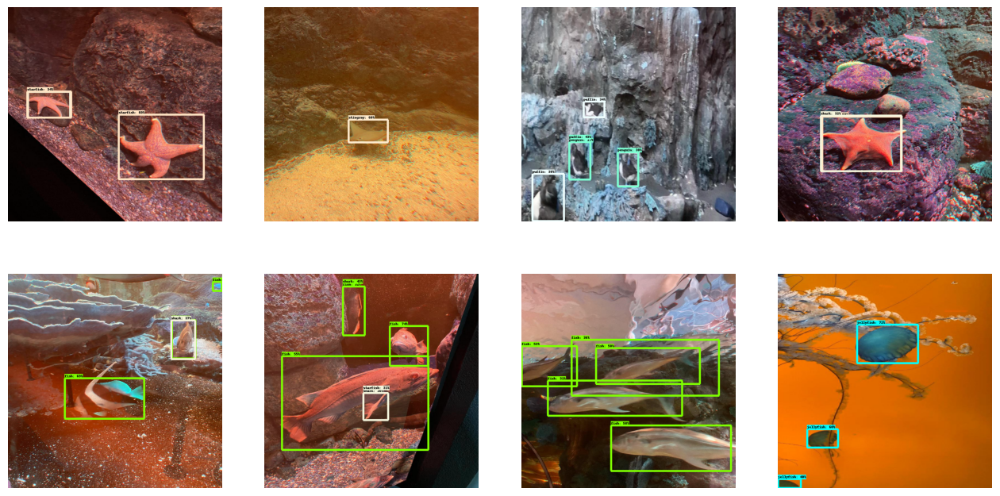

In [87]:
import os, random, cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# ---------------- CONFIG ----------------
val_dir = "/kaggle/input/aquarium-json/valid"

min_score_thresh = 0.3
# visualization layout
N = 8
cols = 4
rows = int(np.ceil(N / cols))

# ---- MODEL DIMENSIONS FOR TFLITE INFERENCE ----
MODEL_H = 640   # TFLite model input height
MODEL_W = 640   # TFLite model input width

# ---------- LOAD TFLITE ----------
interpreter = tf.lite.Interpreter(
    model_path="/kaggle/working/Aquarium_TFOD_EfficientDet_D1.tflite"
)
interpreter.allocate_tensors()

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# ---- FIX MODEL INPUT SHAPE (ONCE) ----
interpreter.resize_tensor_input(
    input_details[0]["index"],
    [1, MODEL_H, MODEL_W, 3],
    strict=True
)
interpreter.allocate_tensors()

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# random image selection
all_imgs = [os.path.join(val_dir, f)
            for f in os.listdir(val_dir)
            if f.lower().endswith((".jpg", ".png", ".jpeg"))]

sample_imgs = random.sample(all_imgs, N)

# load images
raw_images = []
orig_images = []

for p in sample_imgs:
    img = cv2.imread(p)
    orig_images.append(img.copy())
    raw_images.append(np.array(img))

plt.figure(figsize=(4 * cols, 4 * rows))

for i, image in enumerate(raw_images):
    plt.subplot(2, 4, i+1)
    input_image = cv2.resize(image, (640, 640))
    image_np = input_image.copy()
    input_image = input_image[:,:,::-1]
    input_image = np.expand_dims(input_image, 0)

    input_data = (input_image).astype(np.uint8)
    interpreter.set_tensor(input_details[0]["index"], input_data)

    # run inference
    interpreter.invoke()

    # get outputs
    tflite_outputs = []
    print("TFLite outputs types and shapes:")
    for out_detail in output_details:
        output_tensor = interpreter.get_tensor(out_detail["index"])
        tflite_outputs.append(output_tensor)
        print(f"  Output type={type(output_tensor)}, shape={output_tensor.shape}")
    vis_util.visualize_boxes_and_labels_on_image_array(
        image_np,
        tflite_outputs[4][0],
        tflite_outputs[5][0].astype(int),
        tflite_outputs[6][0],
        category_index=category_index,
        use_normalized_coordinates=True,
        max_boxes_to_draw=20,
        min_score_thresh=min_score_thresh,
        agnostic_mode=False,
        instance_masks=None,
        line_thickness=6)
    plt.imshow(image_np)
    plt.axis('off')

plt.show()

INFO: Created TensorFlow Lite delegate for select TF ops.
INFO: TfLiteFlexDelegate delegate: 4 nodes delegated out of 77759 nodes with 2 partitions.

INFO: Created TensorFlow Lite XNNPACK delegate for CPU.


TFLite outputs types and shapes:
  Output type=<class 'numpy.ndarray'>, shape=(1, 110484, 4)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100)
  Output type=<class 'numpy.ndarray'>, shape=(1,)
  Output type=<class 'numpy.ndarray'>, shape=(1, 110484, 7)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100, 4)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100, 7)
TFLite outputs types and shapes:
  Output type=<class 'numpy.ndarray'>, shape=(1, 110484, 4)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100)
  Output type=<class 'numpy.ndarray'>, shape=(1,)
  Output type=<class 'numpy.ndarray'>, shape=(1, 110484, 7)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100, 4)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100, 7)
TFLite outputs types and shapes:
  Output 

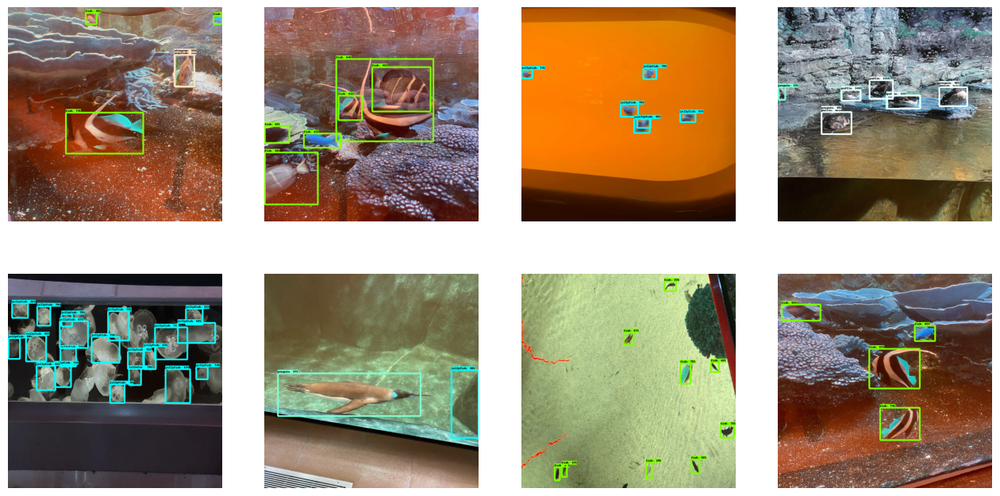

In [71]:
import os, random, cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# ---------------- CONFIG ----------------
val_dir = "/kaggle/input/aquarium-json/valid"

min_score_thresh = 0.3
# visualization layout
N = 8
cols = 4
rows = int(np.ceil(N / cols))

# ---- MODEL DIMENSIONS FOR TFLITE INFERENCE ----
MODEL_H = 768   # TFLite model input height
MODEL_W = 768   # TFLite model input width

# ---------- LOAD TFLITE ----------
interpreter = tf.lite.Interpreter(
    model_path="/kaggle/working/Aquarium_TFOD_EfficientDet_D2.tflite"
)
interpreter.allocate_tensors()

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# ---- FIX MODEL INPUT SHAPE (ONCE) ----
interpreter.resize_tensor_input(
    input_details[0]["index"],
    [1, MODEL_H, MODEL_W, 3],
    strict=True
)
interpreter.allocate_tensors()

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# random image selection
all_imgs = [os.path.join(val_dir, f)
            for f in os.listdir(val_dir)
            if f.lower().endswith((".jpg", ".png", ".jpeg"))]

sample_imgs = random.sample(all_imgs, N)

# load images
raw_images = []
orig_images = []

for p in sample_imgs:
    img = cv2.imread(p)
    orig_images.append(img.copy())
    raw_images.append(np.array(img))

plt.figure(figsize=(4 * cols, 4 * rows))

for i, image in enumerate(raw_images):
    plt.subplot(2, 4, i+1)
    input_image = cv2.resize(image, (768, 768))
    image_np = input_image.copy()
    input_image = input_image[:,:,::-1]
    input_image = np.expand_dims(input_image, 0)

    input_data = (input_image).astype(np.uint8)
    interpreter.set_tensor(input_details[0]["index"], input_data)

    # run inference
    interpreter.invoke()

    # get outputs
    tflite_outputs = []
    print("TFLite outputs types and shapes:")
    for out_detail in output_details:
        output_tensor = interpreter.get_tensor(out_detail["index"])
        tflite_outputs.append(output_tensor)
        print(f"  Output type={type(output_tensor)}, shape={output_tensor.shape}")
    vis_util.visualize_boxes_and_labels_on_image_array(
        image_np,
        tflite_outputs[4][0],
        tflite_outputs[5][0].astype(int),
        tflite_outputs[6][0],
        category_index=category_index,
        use_normalized_coordinates=True,
        max_boxes_to_draw=20,
        min_score_thresh=min_score_thresh,
        agnostic_mode=False,
        instance_masks=None,
        line_thickness=6)
    plt.imshow(image_np)
    plt.axis('off')

plt.show()

INFO: Created TensorFlow Lite delegate for select TF ops.
INFO: TfLiteFlexDelegate delegate: 4 nodes delegated out of 126386 nodes with 2 partitions.

INFO: Created TensorFlow Lite XNNPACK delegate for CPU.


TFLite outputs types and shapes:
  Output type=<class 'numpy.ndarray'>, shape=(1, 150381, 4)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100)
  Output type=<class 'numpy.ndarray'>, shape=(1,)
  Output type=<class 'numpy.ndarray'>, shape=(1, 150381, 7)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100, 4)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100, 7)
TFLite outputs types and shapes:
  Output type=<class 'numpy.ndarray'>, shape=(1, 150381, 4)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100)
  Output type=<class 'numpy.ndarray'>, shape=(1,)
  Output type=<class 'numpy.ndarray'>, shape=(1, 150381, 7)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100, 4)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100)
  Output type=<class 'numpy.ndarray'>, shape=(1, 100, 7)
TFLite outputs types and shapes:
  Output 

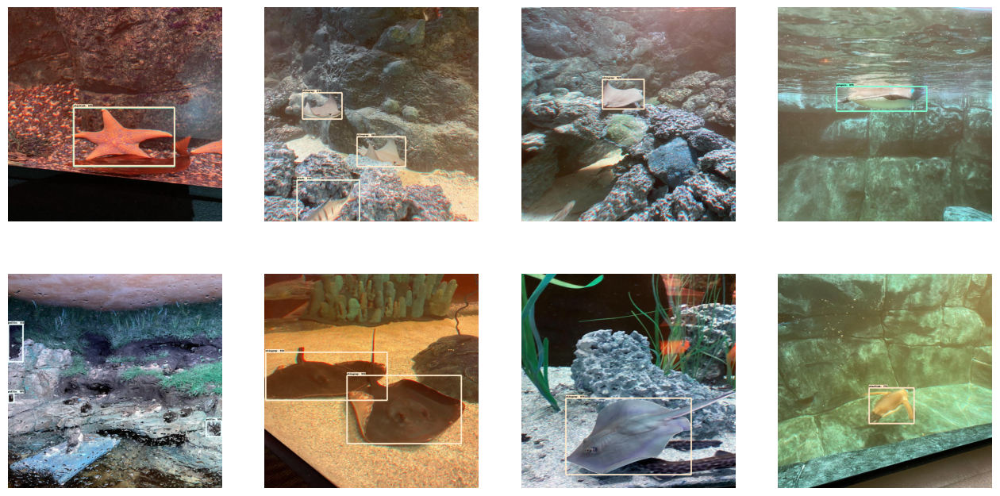

In [52]:
import os, random, cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# ---------------- CONFIG ----------------
val_dir = "/kaggle/input/aquarium-json/valid"

min_score_thresh = 0.3
# visualization layout
N = 8
cols = 4
rows = int(np.ceil(N / cols))

# ---- MODEL DIMENSIONS FOR TFLITE INFERENCE ----
MODEL_H = 896   # TFLite model input height
MODEL_W = 896   # TFLite model input width

# ---------- LOAD TFLITE ----------
interpreter = tf.lite.Interpreter(
    model_path="/kaggle/working/Aquarium_TFOD_EfficientDet_D3.tflite"
)
interpreter.allocate_tensors()

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# ---- FIX MODEL INPUT SHAPE (ONCE) ----
interpreter.resize_tensor_input(
    input_details[0]["index"],
    [1, MODEL_H, MODEL_W, 3],
    strict=True
)
interpreter.allocate_tensors()

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# random image selection
all_imgs = [os.path.join(val_dir, f)
            for f in os.listdir(val_dir)
            if f.lower().endswith((".jpg", ".png", ".jpeg"))]

sample_imgs = random.sample(all_imgs, N)

# load images
raw_images = []
orig_images = []

for p in sample_imgs:
    img = cv2.imread(p)
    orig_images.append(img.copy())
    raw_images.append(np.array(img))

plt.figure(figsize=(4 * cols, 4 * rows))

for i, image in enumerate(raw_images):
    plt.subplot(2, 4, i+1)
    input_image = cv2.resize(image, (896, 896))
    image_np = input_image.copy()
    input_image = input_image[:,:,::-1]
    input_image = np.expand_dims(input_image, 0)

    input_data = (input_image).astype(np.uint8)
    interpreter.set_tensor(input_details[0]["index"], input_data)

    # run inference
    interpreter.invoke()

    # get outputs
    tflite_outputs = []
    print("TFLite outputs types and shapes:")
    for out_detail in output_details:
        output_tensor = interpreter.get_tensor(out_detail["index"])
        tflite_outputs.append(output_tensor)
        print(f"  Output type={type(output_tensor)}, shape={output_tensor.shape}")
    vis_util.visualize_boxes_and_labels_on_image_array(
        image_np,
        tflite_outputs[4][0],
        tflite_outputs[5][0].astype(int),
        tflite_outputs[6][0],
        category_index=category_index,
        use_normalized_coordinates=True,
        max_boxes_to_draw=20,
        min_score_thresh=min_score_thresh,
        agnostic_mode=False,
        instance_masks=None,
        line_thickness=6)
    plt.imshow(image_np)
    plt.axis('off')

plt.show()

In [55]:
def class_wise_nms(
    boxes, scores,
    score_thresh=0.5,
    iou_thresh=0.45,
    max_detections_per_class=20
):
    final_boxes, final_classes, final_scores = [], [], []
    num_classes = scores.shape[1]

    for cls in range(1, num_classes):
        cls_scores = scores[:, cls]
        keep = cls_scores >= score_thresh
        if not np.any(keep):
            continue

        cls_boxes = boxes[keep]
        cls_scores = cls_scores[keep]

        selected = tf.image.non_max_suppression(
            cls_boxes,
            cls_scores,
            max_output_size=max_detections_per_class,
            iou_threshold=iou_thresh
        ).numpy()

        final_boxes.append(cls_boxes[selected])
        final_scores.append(cls_scores[selected])
        final_classes.append(
            np.full(len(selected), cls, dtype=np.int32)
        )

    if not final_boxes:
        return np.empty((0,4)), np.empty((0,)), np.empty((0,))

    return (
        np.concatenate(final_boxes),
        np.concatenate(final_classes),
        np.concatenate(final_scores)
    )

In [56]:
def global_nms(
    boxes, classes, scores,
    iou_thresh=0.5,
    max_detections=50
):
    selected = tf.image.non_max_suppression(
        boxes,
        scores,
        max_output_size=max_detections,
        iou_threshold=iou_thresh
    ).numpy()

    return (
        boxes[selected],
        classes[selected],
        scores[selected]
    )

In [57]:
def draw_labels_cv2(image, boxes, classes, scores, category_index,
                    font_scale=0.9, thickness=2):
    h, w, _ = image.shape

    for box, cls, score in zip(boxes, classes, scores):
        ymin, xmin, ymax, xmax = box
        x1, y1 = int(xmin * w), int(ymin * h)
        x2, y2 = int(xmax * w), int(ymax * h)

        if cls == 0 or cls not in category_index:
            continue

        label = f"{category_index[cls]['name']}: {score:.2f}"

        (tw, th), _ = cv2.getTextSize(
            label, cv2.FONT_HERSHEY_SIMPLEX,
            font_scale, thickness
        )

        cv2.rectangle(image,
                      (x1, y1 - th - 6),
                      (x1 + tw + 4, y1),
                      (0, 0, 0), -1)

        cv2.putText(
            image, label,
            (x1 + 2, y1 - 4),
            cv2.FONT_HERSHEY_SIMPLEX,
            font_scale,
            (255, 255, 255),
            thickness,
            cv2.LINE_AA
        )

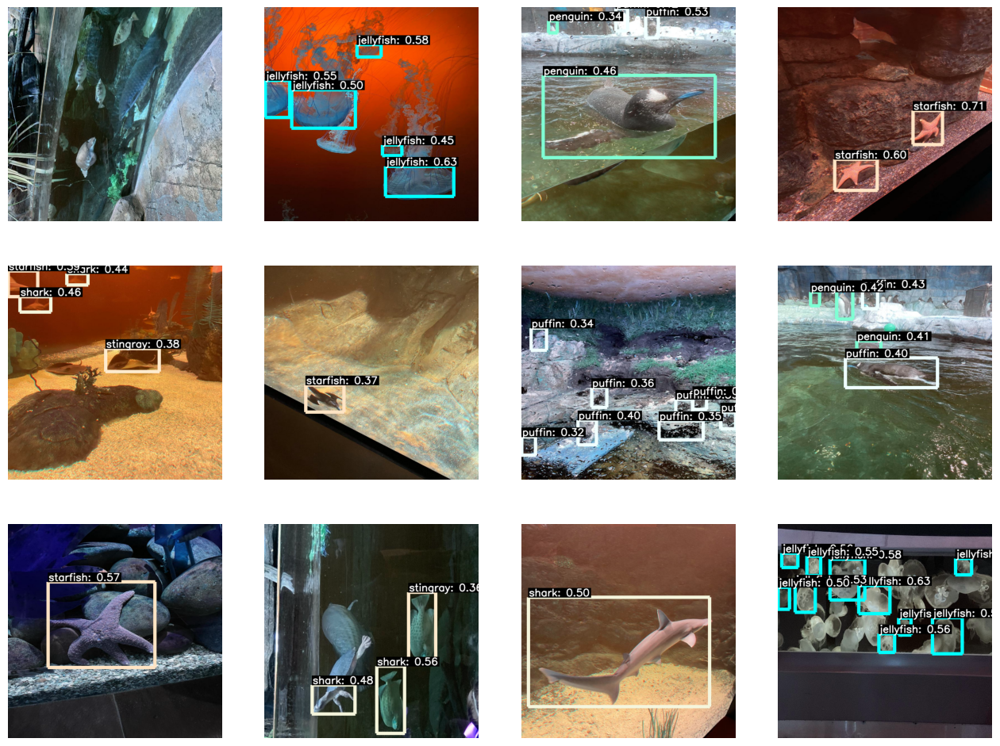

In [118]:
import os, random, cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# ---------------- CONFIG ----------------
val_dir = "/kaggle/input/aquarium-json/valid"

min_score_thresh = 0.3
# visualization layout
N = 12
cols = 4
rows = int(np.ceil(N / cols))

# ---- MODEL DIMENSIONS FOR TFLITE INFERENCE ----
MODEL_H = 640   # TFLite model input height
MODEL_W = 640   # TFLite model input width

# ---------- LOAD TFLITE ----------
interpreter = tf.lite.Interpreter(
    model_path="/kaggle/working/Aquarium_TFOD_EfficientDet_D1.tflite"
)
interpreter.allocate_tensors()

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# ---- FIX MODEL INPUT SHAPE (ONCE) ----
interpreter.resize_tensor_input(
    input_details[0]["index"],
    [1, MODEL_H, MODEL_W, 3],
    strict=True
)
interpreter.allocate_tensors()

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# random image selection
all_imgs = [os.path.join(val_dir, f)
            for f in os.listdir(val_dir)
            if f.lower().endswith((".jpg", ".png", ".jpeg"))]

sample_imgs = random.sample(all_imgs, N)

# load images
raw_images = []
orig_images = []

for p in sample_imgs:
    img = cv2.imread(p)
    orig_images.append(img.copy())
    raw_images.append(np.array(img))

plt.figure(figsize=(4 * cols, 4 * rows))

for i, image in enumerate(raw_images):
    plt.subplot(3, 4, i+1)

    input_image = cv2.resize(image, (640, 640))
    image_np = input_image.copy()

    # BGR → RGB
    input_image = input_image[:, :, ::-1]
    input_image = np.expand_dims(input_image, 0).astype(np.uint8)

    interpreter.set_tensor(input_details[0]["index"], input_image)
    interpreter.invoke()

    # -------- get TFLite outputs --------
    tflite_outputs = [
        interpreter.get_tensor(o["index"]) for o in output_details
    ]

    # RAW outputs (before NMS)
    raw_boxes  = tflite_outputs[0][0]   # (49104, 4)
    raw_scores = tflite_outputs[3][0]   # (49104, num_classes)

    # -------- CUSTOM NMS --------
    boxes, classes, scores = class_wise_nms(
        raw_boxes,
        raw_scores,
        score_thresh=min_score_thresh,
        iou_thresh=0.3,
        max_detections_per_class=10
    )

    boxes, classes, scores = global_nms(
        boxes,
        classes,
        scores,
        iou_thresh=0.3,
        max_detections=10
    )

    # 🔥 FIX: TF returns 0-based class IDs
    classes = classes + 1

    # -------- visualize --------
    vis_util.visualize_boxes_and_labels_on_image_array(
        image_np,
        boxes,
        classes,
        scores,
        category_index=category_index,
        use_normalized_coordinates=True,
        min_score_thresh=min_score_thresh,
        skip_labels=True,
        skip_scores=True,
        line_thickness=10
    )

    # draw big labels
    draw_labels_cv2(
        image_np,
        boxes,
        classes,
        scores,
        category_index,
        font_scale=1.0,
        thickness=2
    )

    plt.imshow(image_np)
    plt.axis("off")

plt.show()

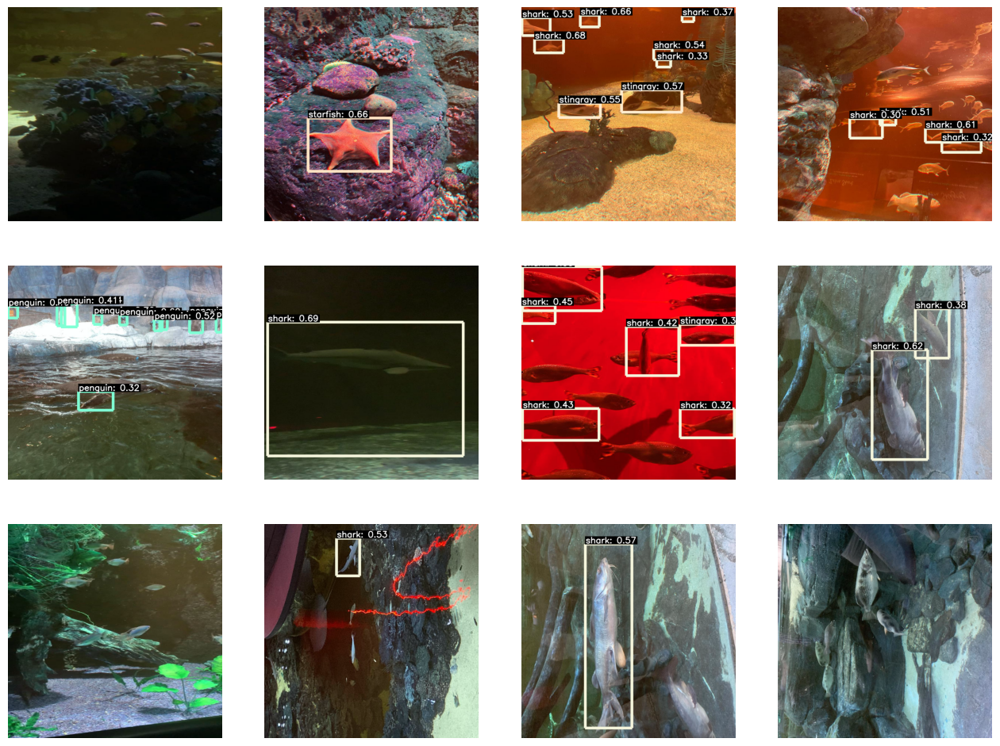

In [83]:
import os, random, cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# ---------------- CONFIG ----------------
val_dir = "/kaggle/input/aquarium-json/valid"

min_score_thresh = 0.3
# visualization layout
N = 12
cols = 4
rows = int(np.ceil(N / cols))

# ---- MODEL DIMENSIONS FOR TFLITE INFERENCE ----
MODEL_H = 768   # TFLite model input height
MODEL_W = 768   # TFLite model input width

# ---------- LOAD TFLITE ----------
interpreter = tf.lite.Interpreter(
    model_path="/kaggle/working/Aquarium_TFOD_EfficientDet_D2.tflite"
)
interpreter.allocate_tensors()

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# ---- FIX MODEL INPUT SHAPE (ONCE) ----
interpreter.resize_tensor_input(
    input_details[0]["index"],
    [1, MODEL_H, MODEL_W, 3],
    strict=True
)
interpreter.allocate_tensors()

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# random image selection
all_imgs = [os.path.join(val_dir, f)
            for f in os.listdir(val_dir)
            if f.lower().endswith((".jpg", ".png", ".jpeg"))]

sample_imgs = random.sample(all_imgs, N)

# load images
raw_images = []
orig_images = []

for p in sample_imgs:
    img = cv2.imread(p)
    orig_images.append(img.copy())
    raw_images.append(np.array(img))

plt.figure(figsize=(4 * cols, 4 * rows))

for i, image in enumerate(raw_images):
    plt.subplot(3, 4, i+1)

    input_image = cv2.resize(image, (768, 768))
    image_np = input_image.copy()

    # BGR → RGB
    input_image = input_image[:, :, ::-1]
    input_image = np.expand_dims(input_image, 0).astype(np.uint8)

    interpreter.set_tensor(input_details[0]["index"], input_image)
    interpreter.invoke()

    # -------- get TFLite outputs --------
    tflite_outputs = [
        interpreter.get_tensor(o["index"]) for o in output_details
    ]

    # RAW outputs (before NMS)
    raw_boxes  = tflite_outputs[0][0]   # (49104, 4)
    raw_scores = tflite_outputs[3][0]   # (49104, num_classes)

    # -------- CUSTOM NMS --------
    boxes, classes, scores = class_wise_nms(
        raw_boxes,
        raw_scores,
        score_thresh=min_score_thresh,
        iou_thresh=0.3,
        max_detections_per_class=10
    )

    boxes, classes, scores = global_nms(
        boxes,
        classes,
        scores,
        iou_thresh=0.3,
        max_detections=10
    )

    # 🔥 FIX: TF returns 0-based class IDs
    classes = classes + 1

    # -------- visualize --------
    vis_util.visualize_boxes_and_labels_on_image_array(
        image_np,
        boxes,
        classes,
        scores,
        category_index=category_index,
        use_normalized_coordinates=True,
        min_score_thresh=min_score_thresh,
        skip_labels=True,
        skip_scores=True,
        line_thickness=10
    )

    # draw big labels
    draw_labels_cv2(
        image_np,
        boxes,
        classes,
        scores,
        category_index,
        font_scale=1.0,
        thickness=2
    )

    plt.imshow(image_np)
    plt.axis("off")

plt.show()

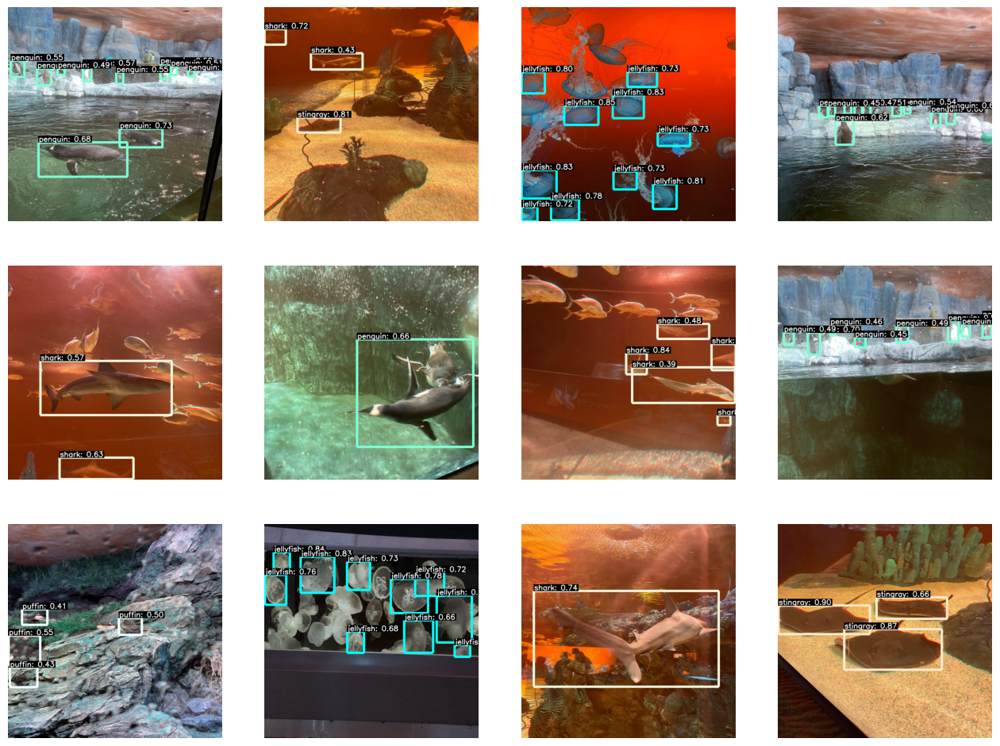

In [69]:
import os, random, cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# ---------------- CONFIG ----------------
val_dir = "/kaggle/input/aquarium-json/test"

min_score_thresh = 0.3
# visualization layout
N = 12
cols = 4
rows = int(np.ceil(N / cols))

# ---- MODEL DIMENSIONS FOR TFLITE INFERENCE ----
MODEL_H = 896   # TFLite model input height
MODEL_W = 896   # TFLite model input width

# ---------- LOAD TFLITE ----------
interpreter = tf.lite.Interpreter(
    model_path="/kaggle/working/Aquarium_TFOD_EfficientDet_D3.tflite"
)
interpreter.allocate_tensors()

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# ---- FIX MODEL INPUT SHAPE (ONCE) ----
interpreter.resize_tensor_input(
    input_details[0]["index"],
    [1, MODEL_H, MODEL_W, 3],
    strict=True
)
interpreter.allocate_tensors()

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# random image selection
all_imgs = [os.path.join(val_dir, f)
            for f in os.listdir(val_dir)
            if f.lower().endswith((".jpg", ".png", ".jpeg"))]

sample_imgs = random.sample(all_imgs, N)

# load images
raw_images = []
orig_images = []

for p in sample_imgs:
    img = cv2.imread(p)
    orig_images.append(img.copy())
    raw_images.append(np.array(img))

plt.figure(figsize=(4 * cols, 4 * rows))

for i, image in enumerate(raw_images):
    plt.subplot(3, 4, i+1)

    input_image = cv2.resize(image, (896, 896))
    image_np = input_image.copy()

    # BGR → RGB
    input_image = input_image[:, :, ::-1]
    input_image = np.expand_dims(input_image, 0).astype(np.uint8)

    interpreter.set_tensor(input_details[0]["index"], input_image)
    interpreter.invoke()

    # -------- get TFLite outputs --------
    tflite_outputs = [
        interpreter.get_tensor(o["index"]) for o in output_details
    ]

    # RAW outputs (before NMS)
    raw_boxes  = tflite_outputs[0][0]   # (49104, 4)
    raw_scores = tflite_outputs[3][0]   # (49104, num_classes)

    # -------- CUSTOM NMS --------
    boxes, classes, scores = class_wise_nms(
        raw_boxes,
        raw_scores,
        score_thresh=min_score_thresh,
        iou_thresh=0.3,
        max_detections_per_class=10
    )

    boxes, classes, scores = global_nms(
        boxes,
        classes,
        scores,
        iou_thresh=0.3,
        max_detections=10
    )

    # 🔥 FIX: TF returns 0-based class IDs
    classes = classes + 1

    # -------- visualize --------
    vis_util.visualize_boxes_and_labels_on_image_array(
        image_np,
        boxes,
        classes,
        scores,
        category_index=category_index,
        use_normalized_coordinates=True,
        min_score_thresh=min_score_thresh,
        skip_labels=True,
        skip_scores=True,
        line_thickness=10
    )

    # draw big labels
    draw_labels_cv2(
        image_np,
        boxes,
        classes,
        scores,
        category_index,
        font_scale=1.0,
        thickness=2
    )

    plt.imshow(image_np)
    plt.axis("off")

plt.show()

---